# Calibrator scans, a system perspective

This notebook runs through how to use some basic functionality to look at calibrators in different beams, both raw data and bandpass solutions. The emphasis is on plots useful for system diagnostics.

It should be run within the commissioning/crosscal directory (can be found on github at https://github.com/apertif/commissioning)

Authored by Betsey Adams, 15 March 2019



## Setup notebook and dependencies

In [1]:
#Load all magic and packaged needed
%matplotlib inline

import sys
import crosscal as cc

import apercal

print(apercal.__version__)
print(apercal.__file__)

/home/apercal/apercal/apercal/libs/lib.py:9: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "/usr/lib/python2.7/runpy.py", line 174, in _run_module_as_main
    "__main__", fname, loader, pkg_name)
  File "/usr/lib/python2.7/runpy.py", line 72, in _run_code
    exec code in run_globals
  File "/home/apercal/pipeline/lib/python2.7/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/home/apercal/pipeline/local/lib/python2.7/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/home/apercal/pipeline/local/lib/python2.7/site-packages/ipykernel/kernelapp.py", line 486, in start
    self.io_loop.start()
  File "/home/a

2.3
/home/apercal/apercal/apercal/__init__.pyc


## Setup logging

In [2]:
#start apercal logger, because I'll use apercal routines
#and may be helpful to have that record
#Can also skip this
%config IPCompleter.greedy=True
import apercal.libs.lib as lib
lib.setup_logger('info', logfile='/home/adams/commissioning/crosscal/log/ccal_scans.log')

root - INFO : Logging started!
root - INFO : To see the log in a bash window use the following command:
root - INFO : tail -n +1 -f /home/adams/commissioning/crosscal/log/ccal_scans.log


## Define global variables

In [3]:
basedir = '/data/adams/apertif/ccal_scans' #this is where all data will be written to
imagepath = '/home/adams/commissioing/crosscal/img' #this is where images are written to
phasemin = -3
phasemax = 3 #min & max phase values to plot in degrees
flag = True  #whether data should be flagged
docal = True  #whethter calibration should be done
bpsols = True #whether to plot bpsols

The toggles above are connected - if flag is turned off, calibration and BP solutions should be treated with large skepticism. And if docal is turned off, bpsols should aslo be turned.

## Get dictionary of all calibrator switching scans

In [4]:
scandict = cc.get_switching_scan_dict()

Total number of results found in ATDB for IMAGING: 2808
Total number of results returned for IMAGING: 2808
Total time to run query: 18.17 sec
First scan, number in switch
181211025_3C147  40
181214019_3C147  39
190107022_3c147  40
190108010_3c147  41
190109021_3c147  40
190110029_3c147  38
190121017_3c147  39
190122015_3c147  40
190123008_3c147  39
190124029_3c147  39
190125019_3C48  39
190128002_3C286  75
190204015_3c147  39
190205015_3c147  38
190206020_3c147  40
190207019_3c147  40
190208028_3C48  42
190220013_3C147  40
190221011_3C147  40
190222017_3C48  47
190301020_3C147  40
190302027_CTD93  40
190302068_3C147  34
190303007_3C286  40
190303047_CTD93  40
190304018_CTD93  37
190305009_3C147  40
190309001_CTD93  40
190311071_3C147  81
190313069_3C147  81
190314075_3C147  44


## Select the dataset to examine


In [5]:
scanset = '190314075_3C147'

#get information out of scanset
split_scanset = scanset.split('_')
fluxcal = split_scanset[1]
scan = split_scanset[0]

## Get the calibrated data

In [6]:
#call a convenience function that copies, updates, flags and calibrates data
scanlist,beamlist = cc.get_cal_data(scandict,basedir,run=True,mode='single',scanset=scanset,flag=flag,docal=docal) #get last switching scan by default

config - INFO :  No configuration file given or file not found, using default values.
apercal.modules.preflag - INFO : Starting Pre-flagging step
apercal.modules.preflag - INFO : Flagging shadowed antennas
apercal.modules.preflag - INFO : Shadowed antenna(s) for flux calibrator were already flagged
apercal.modules.preflag - WARNING : Polarised calibrator dataset not available or dataset not specified. Not flagging shadowed antennas for polarised calibrator
apercal.modules.preflag - WARNING : No target dataset specified! Not flagging shadowed antennas for target datasets
apercal.modules.preflag - INFO : Preliminary bandpass table was already derived


In running mode, will execute commands
Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314075/00/raw/WSRTA190314075_B000.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging auto-correlations
apercal.modules.preflag - INFO : Auto-correlations for flux c

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314076/00/raw/WSRTA190314076_B001.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging auto-correlations
apercal.modules.preflag - INFO : Auto-correlations for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calib

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314077/00/raw/WSRTA190314077_B002.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging auto-correlations
apercal.modules.preflag - INFO : Auto-correlations for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calib

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314078/00/raw/WSRTA190314078_B003.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314079/00/raw/WSRTA190314079_B004.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging auto-correlations
apercal.modules.preflag - INFO : Auto-correlations for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calib

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314080/00/raw/WSRTA190314080_B005.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314081/00/raw/WSRTA190314081_B006.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314082/00/raw/WSRTA190314082_B007.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging auto-correlations
apercal.modules.preflag - INFO : Auto-correlations for flux c

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314083/00/raw/WSRTA190314083_B008.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging auto-correlations
apercal.modules.preflag - INFO : Auto-correlations for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calib

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314084/00/raw/WSRTA190314084_B009.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314085/00/raw/WSRTA190314085_B010.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging auto-correlations
apercal.modules.preflag - INFO : Auto-correlations for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calib

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314086/00/raw/WSRTA190314086_B011.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314087/00/raw/WSRTA190314087_B012.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging auto-correlations
apercal.modules.preflag - INFO : Auto-correlations for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calib

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314088/00/raw/WSRTA190314088_B013.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314089/00/raw/WSRTA190314089_B014.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging auto-correlations
apercal.modules.preflag - INFO : Auto-correlations for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calib

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314090/00/raw/WSRTA190314090_B015.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314091/00/raw/WSRTA190314091_B016.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314092/00/raw/WSRTA190314092_B017.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314093/00/raw/WSRTA190314093_B018.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314094/00/raw/WSRTA190314094_B019.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314095/00/raw/WSRTA190314095_B020.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314096/00/raw/WSRTA190314096_B021.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314097/00/raw/WSRTA190314097_B022.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging auto-correlations
apercal.modules.preflag - INFO : Auto-correlations for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calib

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314098/00/raw/WSRTA190314098_B023.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314099/00/raw/WSRTA190314099_B024.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314100/00/raw/WSRTA190314100_B025.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314101/00/raw/WSRTA190314101_B026.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314102/00/raw/WSRTA190314102_B027.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314103/00/raw/WSRTA190314103_B028.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging auto-correlations
apercal.modules.preflag - INFO : Auto-correlations for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calib

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314104/00/raw/WSRTA190314104_B029.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314105/00/raw/WSRTA190314105_B030.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314106/00/raw/WSRTA190314106_B031.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314107/00/raw/WSRTA190314107_B032.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314108/00/raw/WSRTA190314108_B033.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging auto-correlations
apercal.modules.preflag - INFO : Auto-correlations for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Auto-correlations for polariased calibrator dataset will not be flagged!
apercal.modules.preflag - WARNING : Target dataset not specified. Auto-correlations for target beam dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Pre-flagging step done
config - INFO :  No configuration file given or file not found, using default values.
apercal.modules.ccal - INFO : S

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314109/00/raw/WSRTA190314109_B034.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314110/00/raw/WSRTA190314110_B035.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging auto-correlations
apercal.modules.preflag - INFO : Auto-correlations for flux c

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314111/00/raw/WSRTA190314111_B036.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging auto-correlations
apercal.modules.preflag - INFO : Auto-correlations for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calib

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314112/00/raw/WSRTA190314112_B037.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314113/00/raw/WSRTA190314113_B038.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314114/00/raw/WSRTA190314114_B039.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314115/00/raw/WSRTA190314115_B000.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314116/00/raw/WSRTA190314116_B000.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314117/00/raw/WSRTA190314117_B001.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

Copying data
Successful read/write open of default-locked table /data/adams/apertif/ccal_scans/190314118/00/raw/WSRTA190314118_B002.MS::FIELD: 9 columns, 1 rows


apercal.modules.preflag - INFO : Preliminary bandpass table was already derived
apercal.modules.preflag - INFO : Flux calibrator was already flagged with AOFlagger!
apercal.modules.preflag - INFO : Flagging subband edges
apercal.modules.preflag - INFO : Subband edges for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Subband edges of polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Subband edges of target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging ghost channels
apercal.modules.preflag - INFO : Ghost channels for flux calibrator were already flagged
apercal.modules.preflag - WARNING : No polarised calibrator dataset specified. Ghosts in polarised calibrator will not be flagged!
apercal.modules.preflag - WARNING : No target dataset specified. Ghosts in target dataset(s) will not be flagged!
apercal.modules.preflag - INFO : Flagging

## Raw data

In [7]:
raw = cc.RawData(fluxcal,basedir,scanlist,beamlist)
raw.get_data()

### Plot raw amplitude, averaged over baselines per antenna

/home/apercal/pipeline/local/lib/python2.7/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


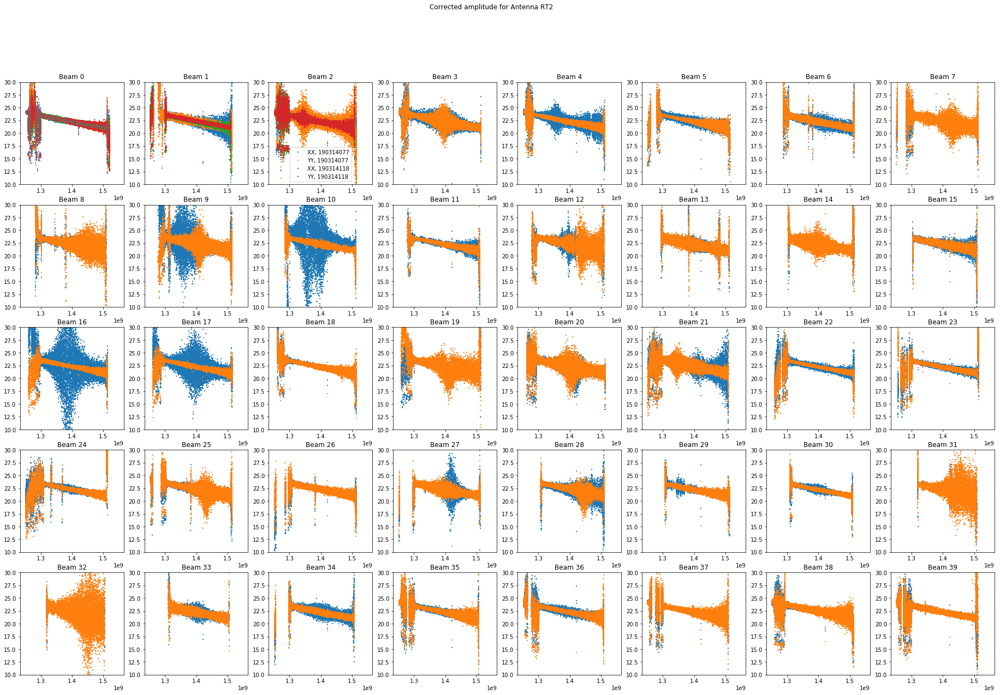

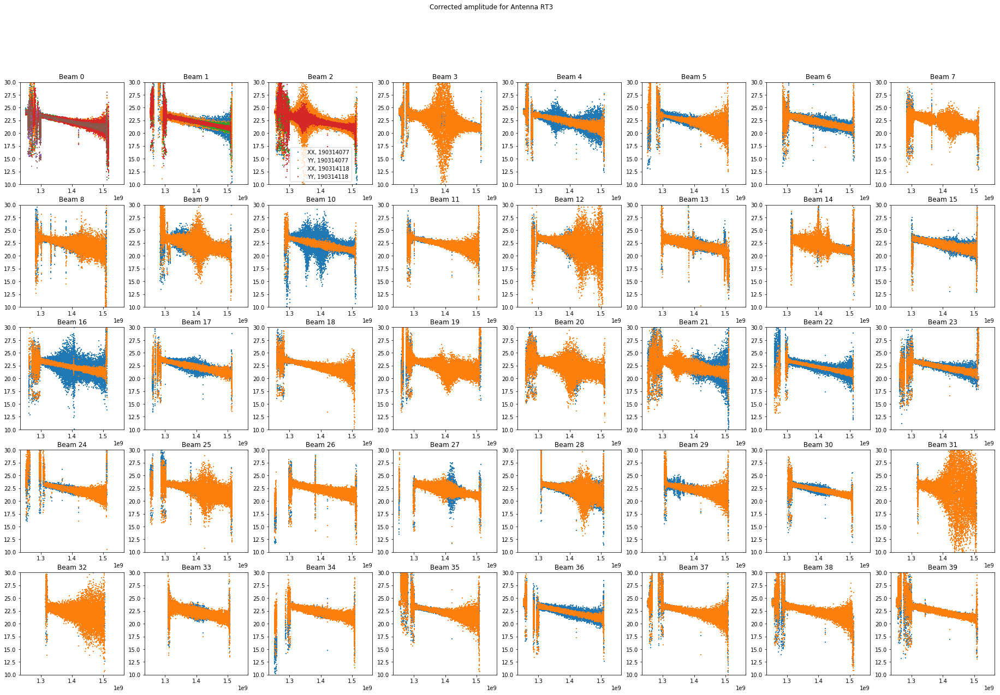

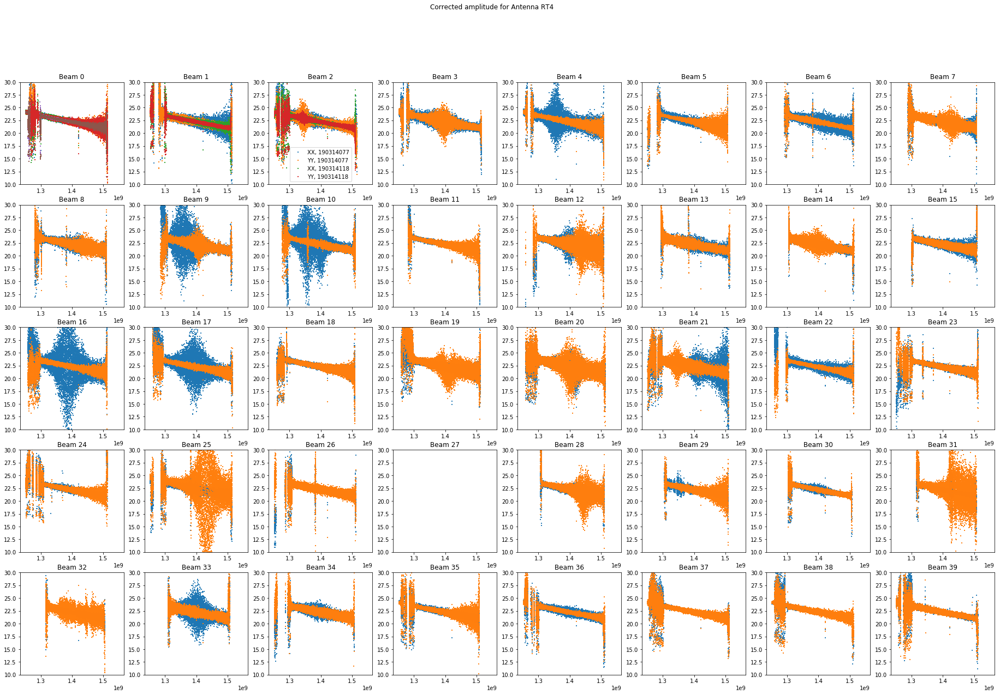

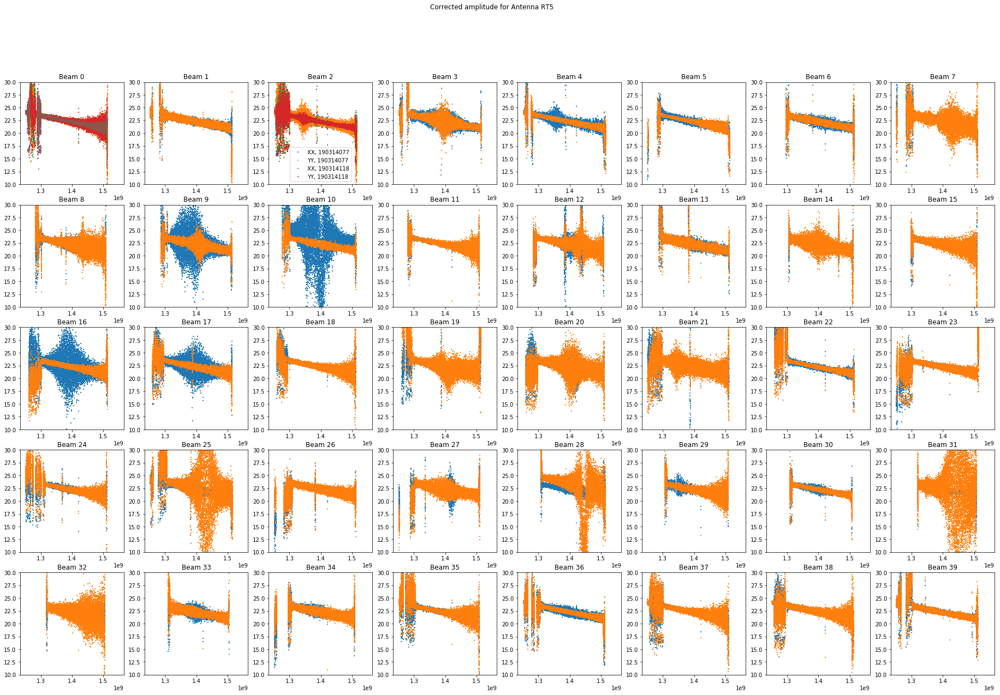

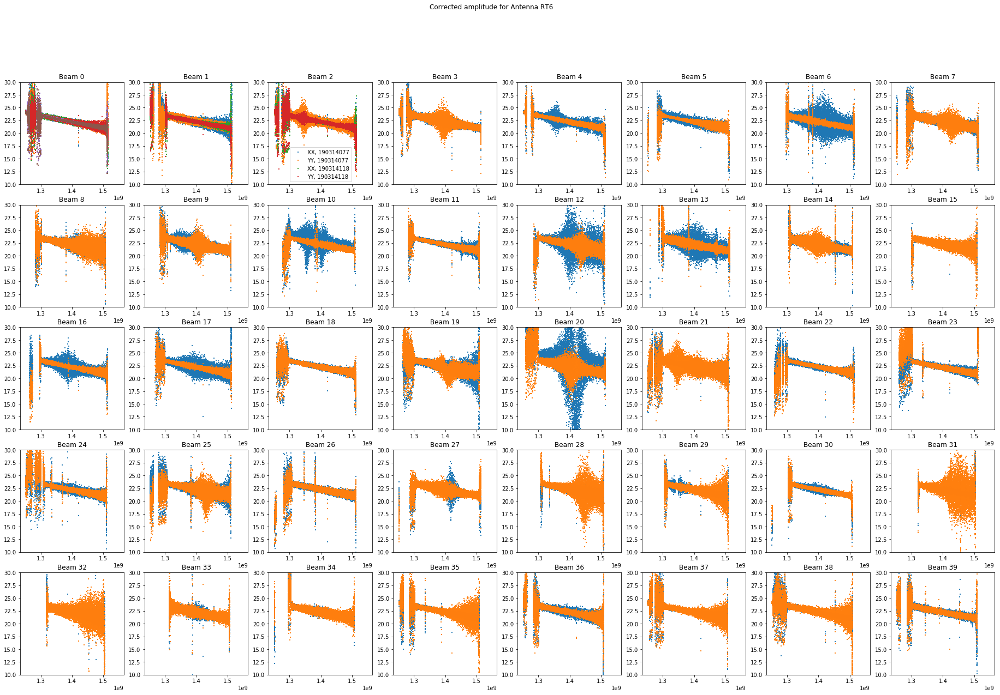

...

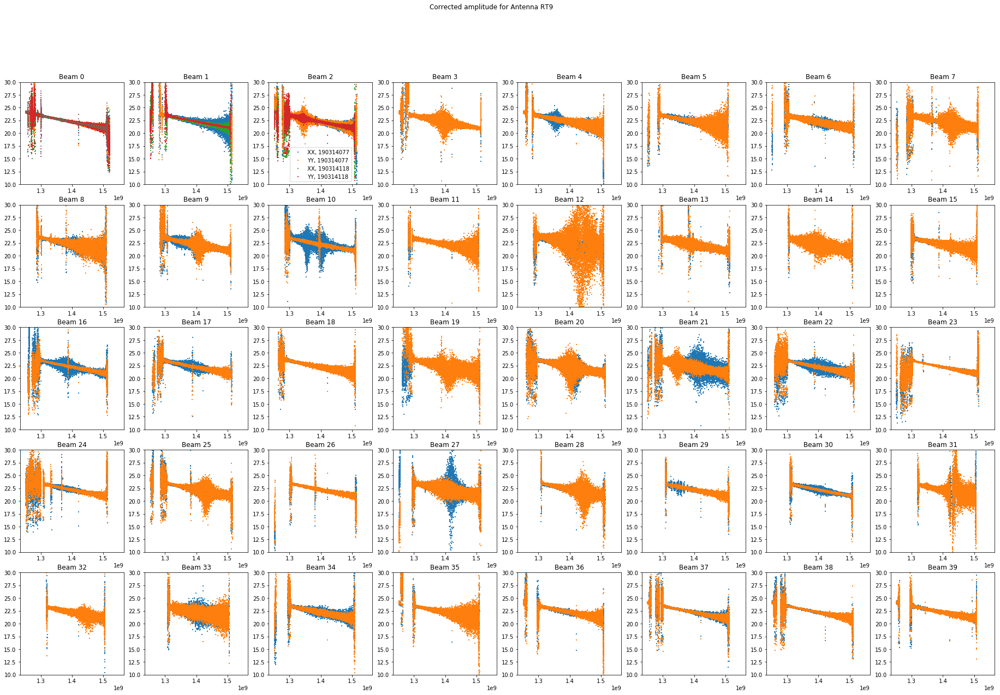

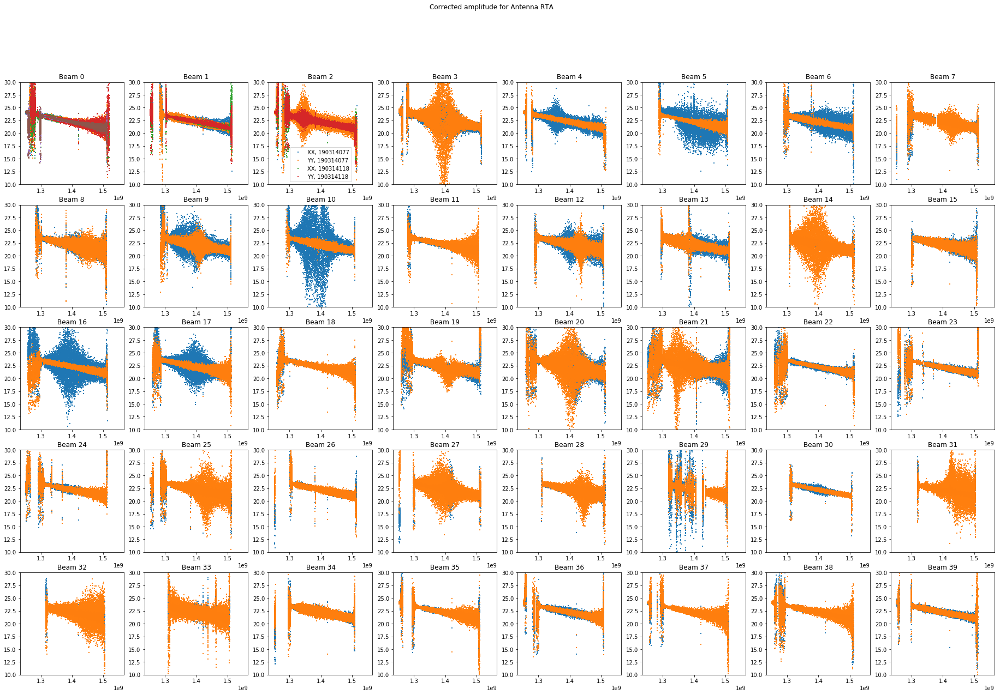

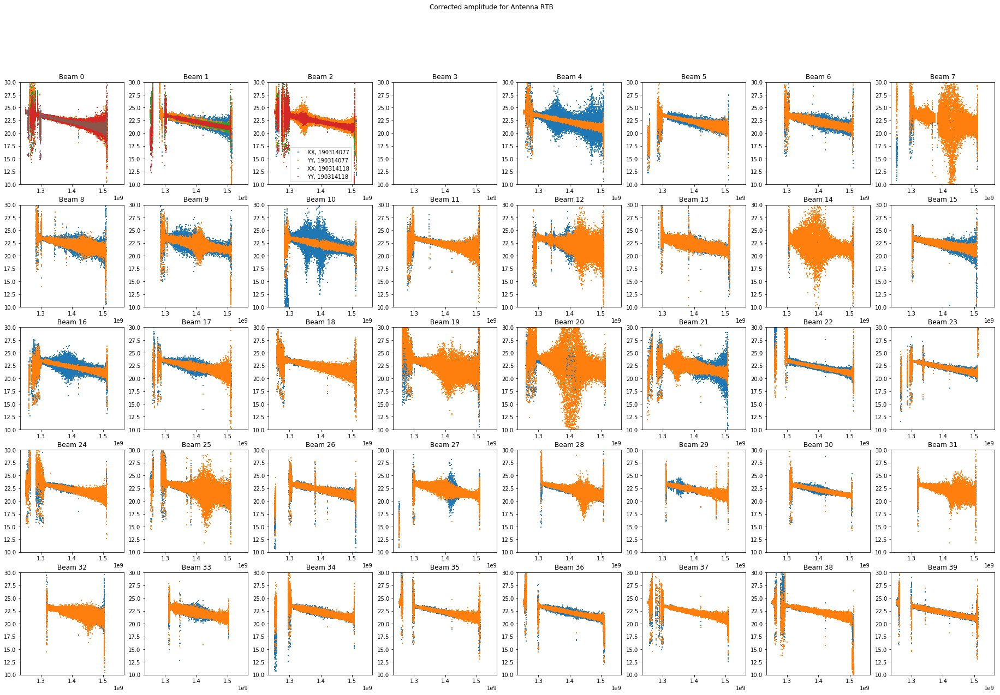

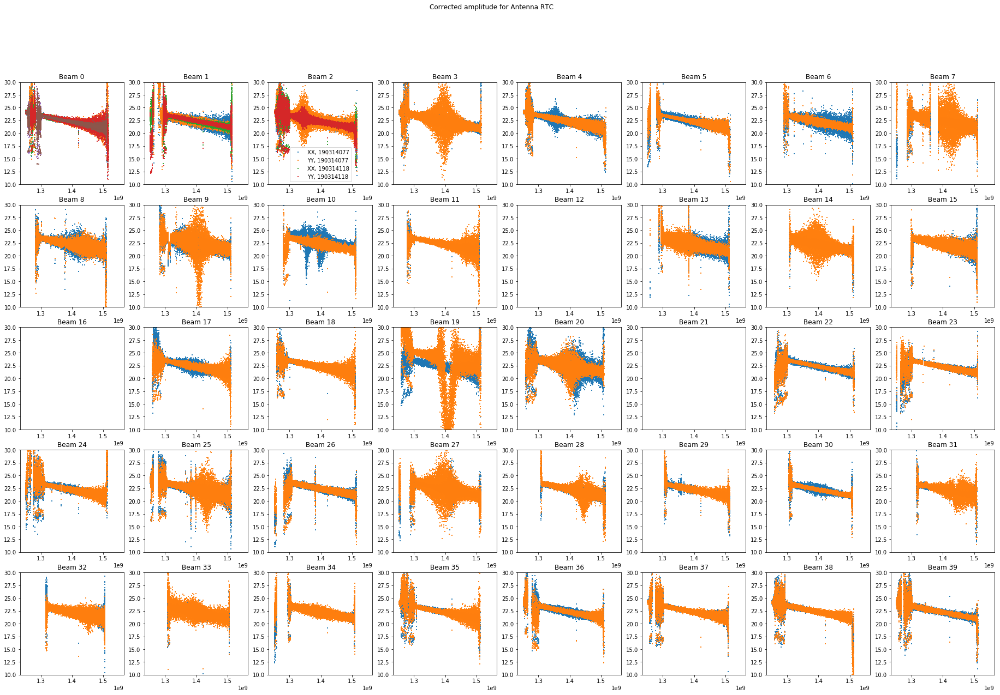

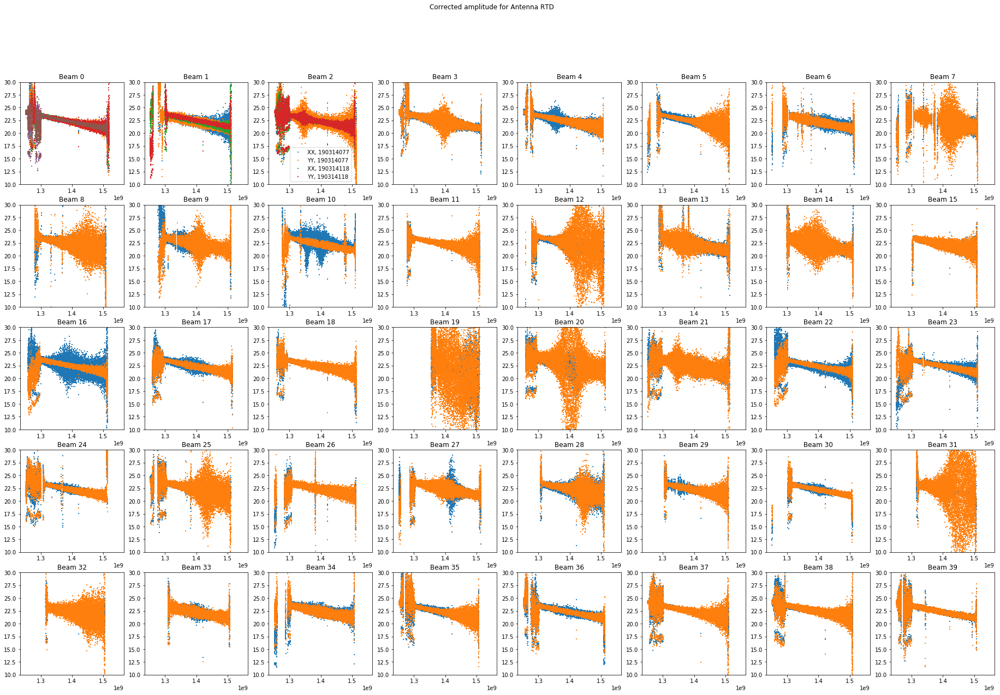

In [8]:
raw.plot_amp(imagepath=imagepath)

### Plot raw data phase, averaged over baselines per antenna

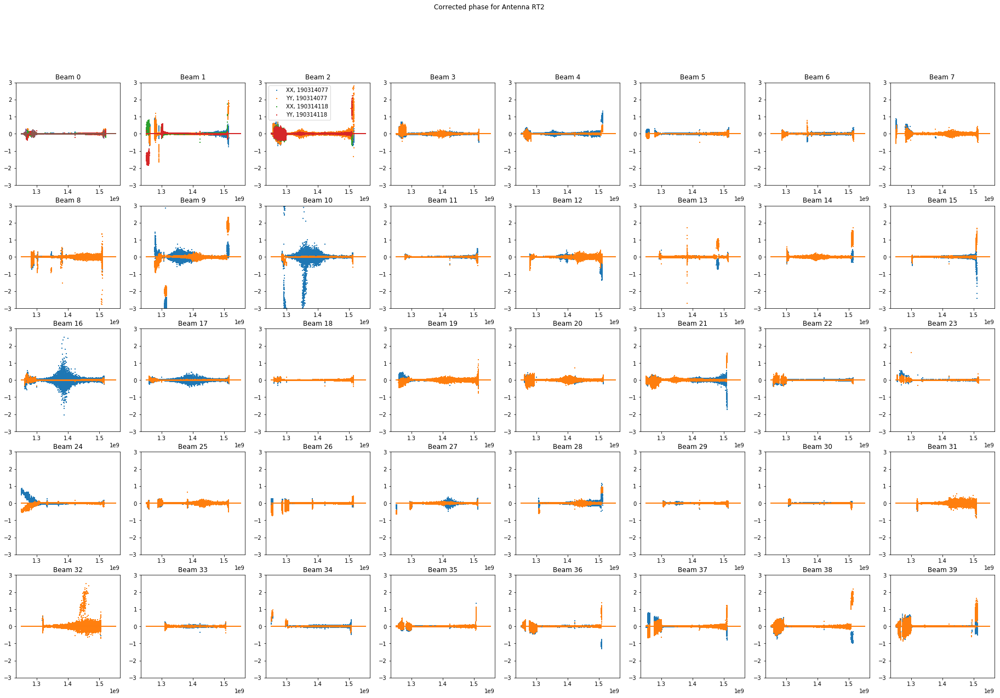

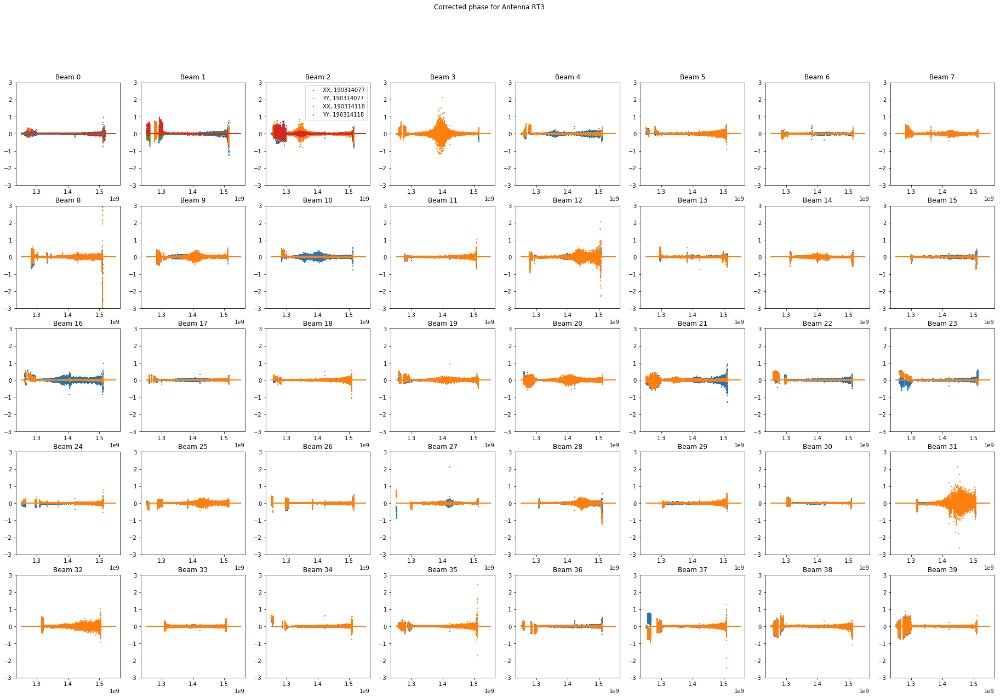

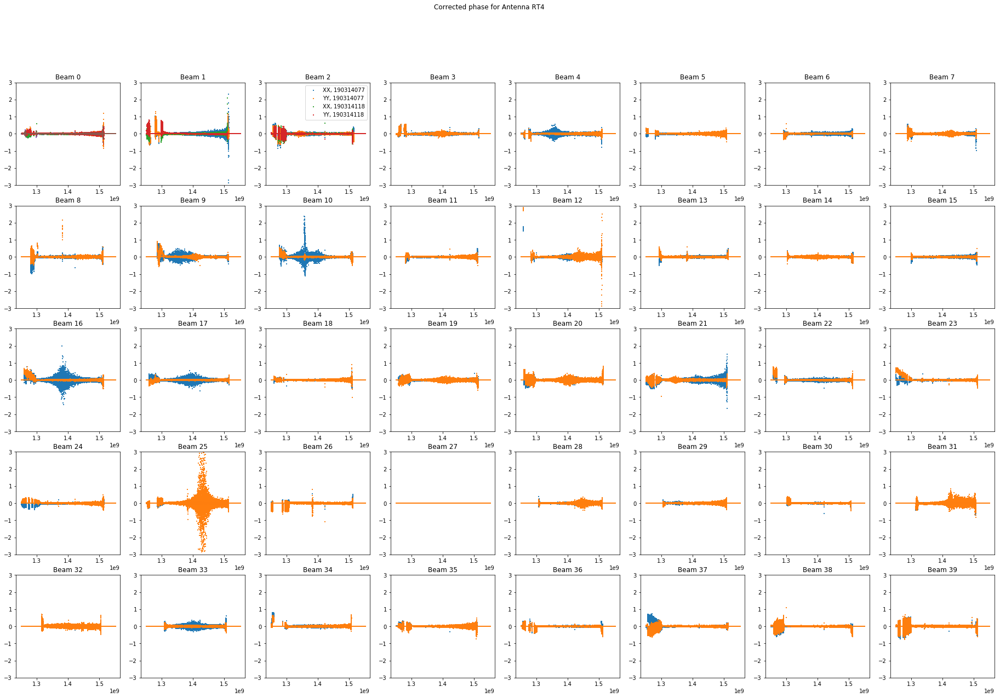

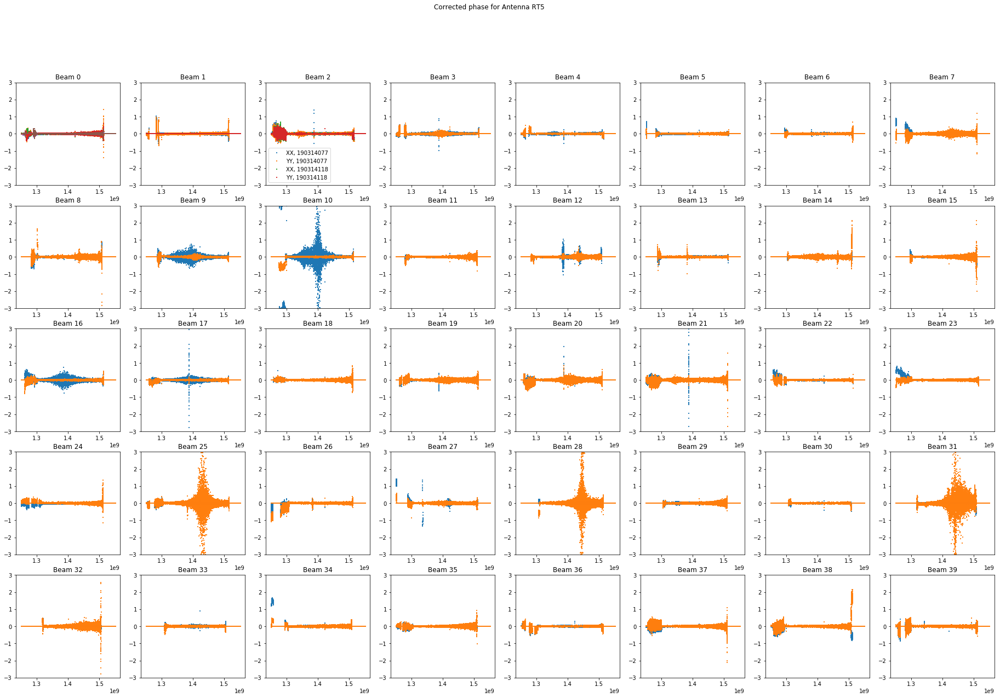

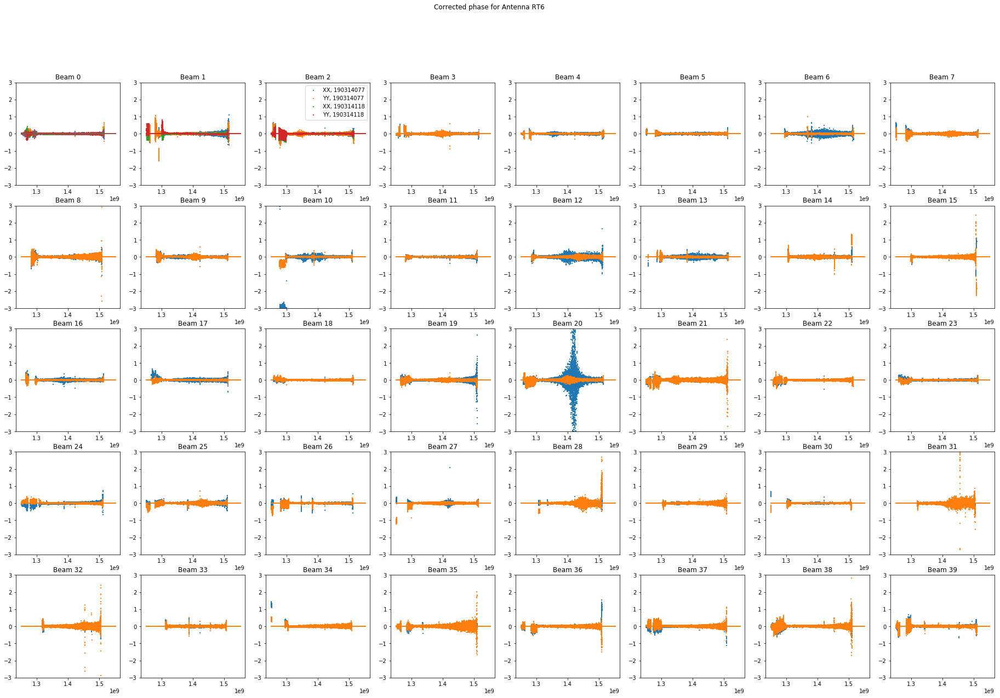

...

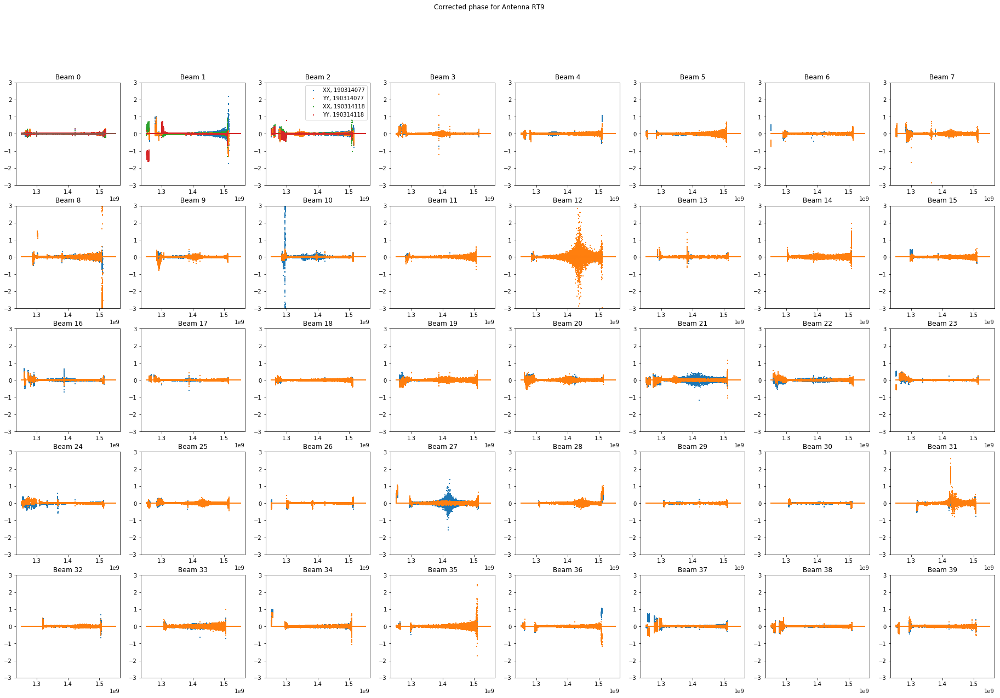

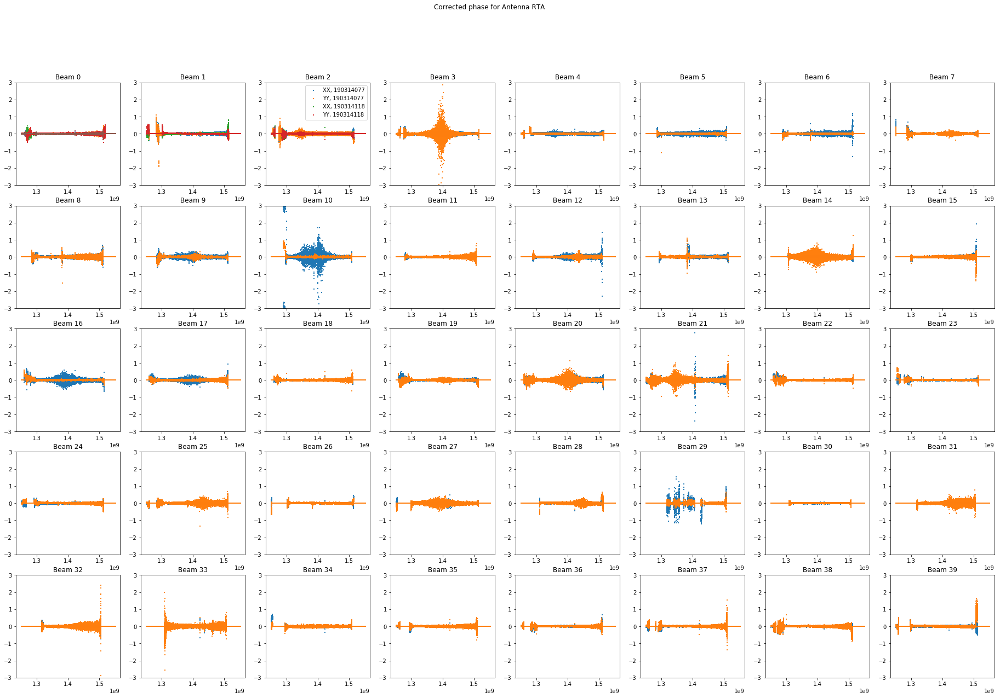

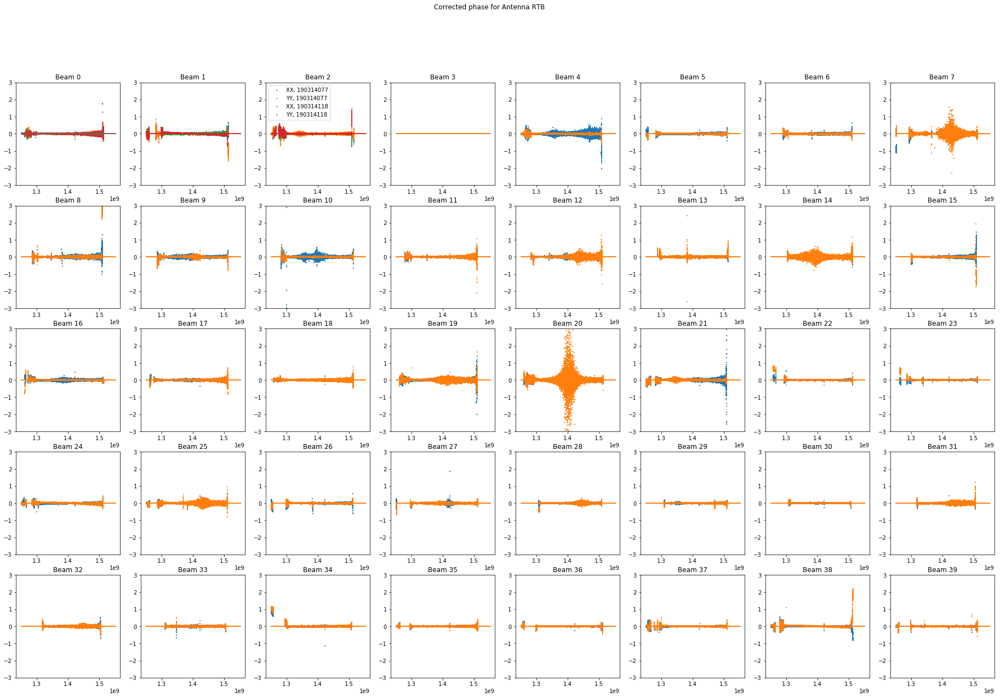

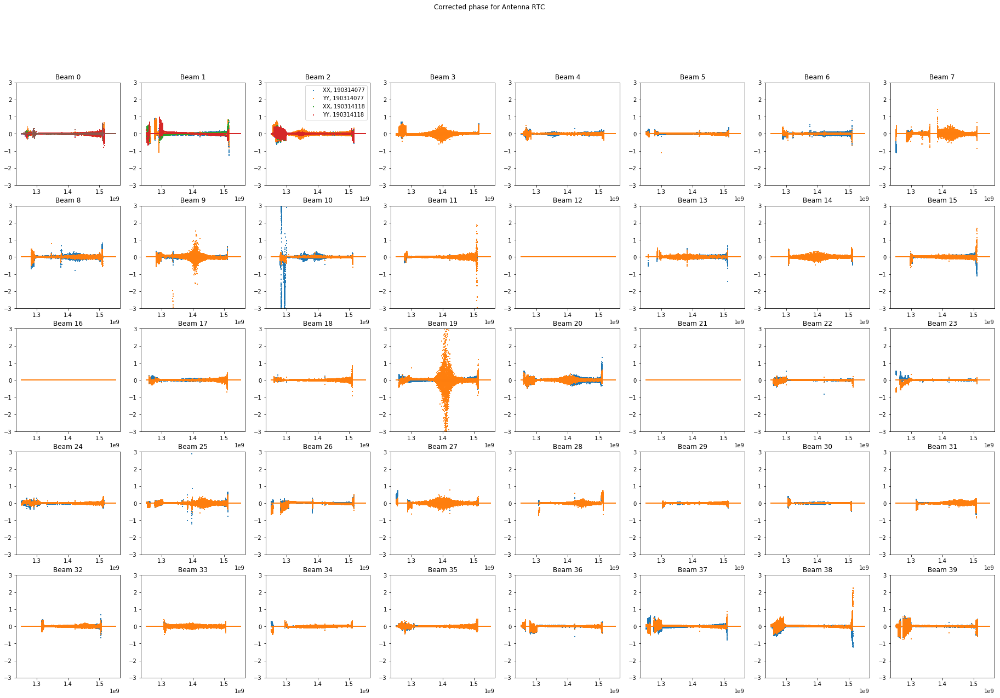

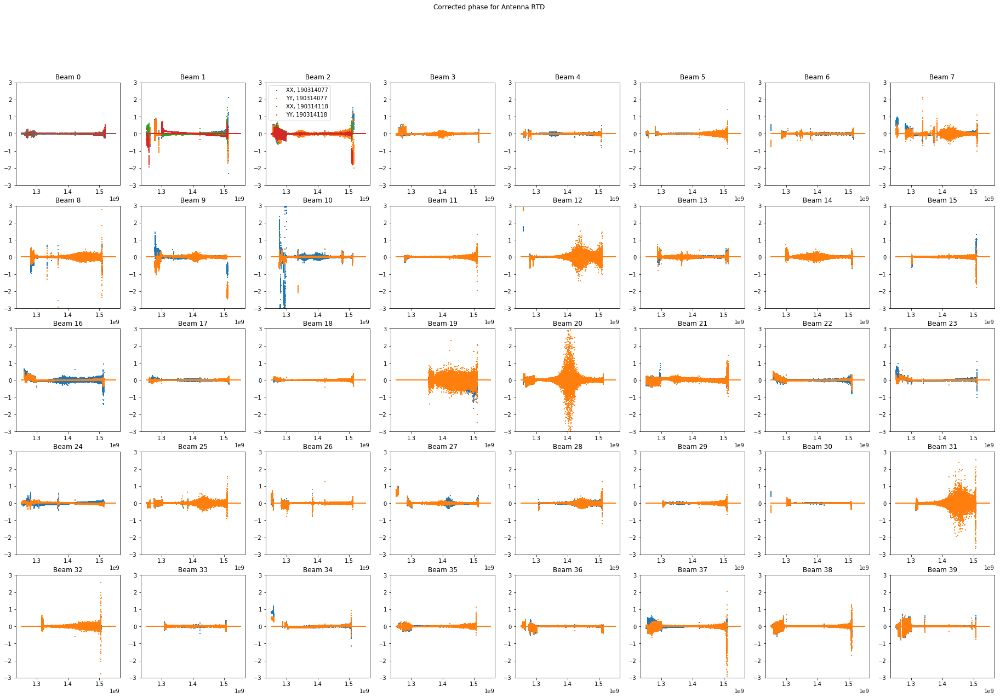

In [9]:
raw.plot_phase(imagepath=imagepath,ymin=phasemin,ymax=phasemax)

## Bandpass solutions

In [10]:
if bpsols == True:
    #first initialize the object
    bp = cc.BPSols(fluxcal,basedir,scanlist,beamlist)
    #then get the data
    bp.get_data()

### Plot BP amplitudes

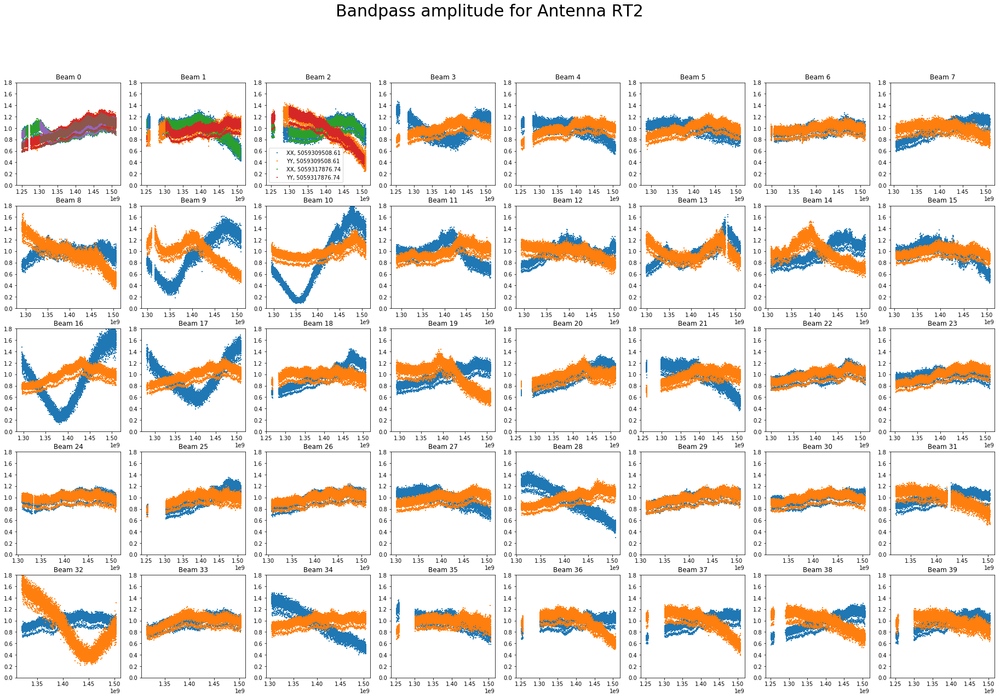

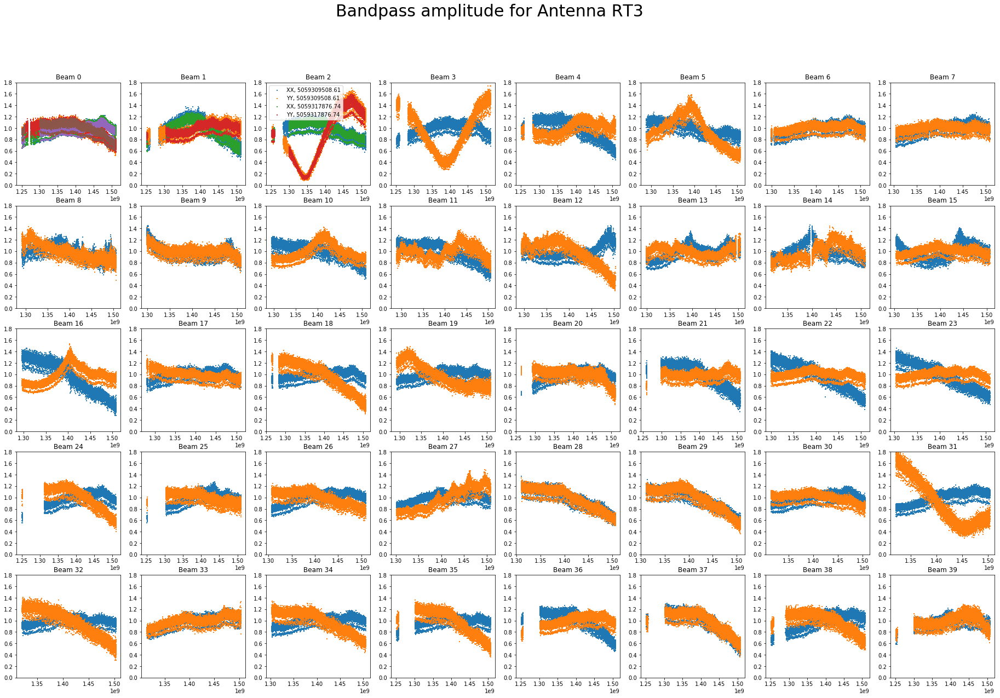

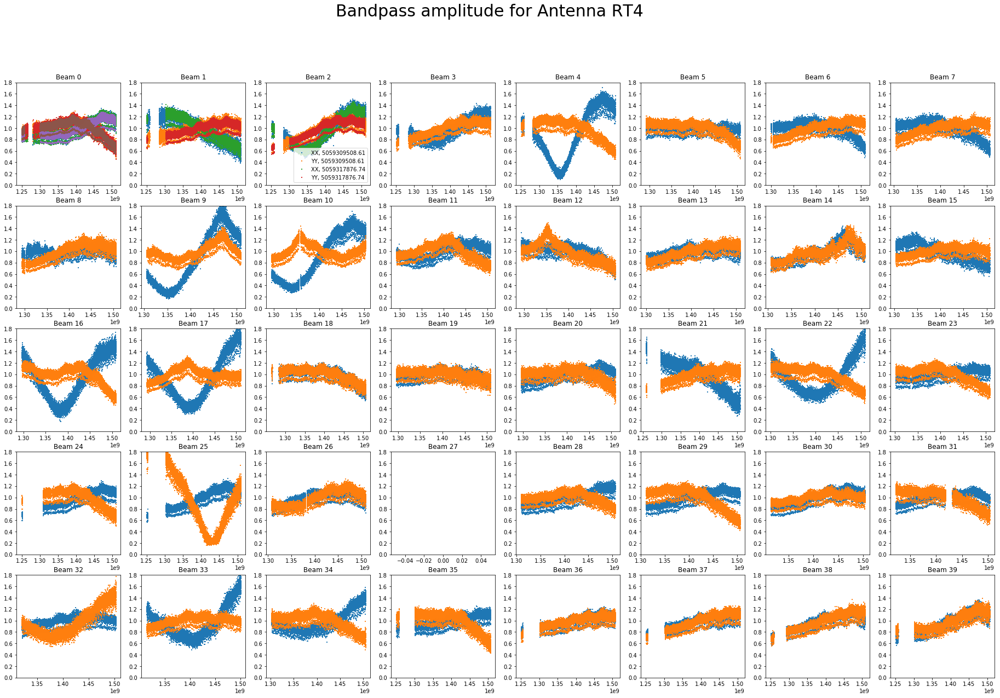

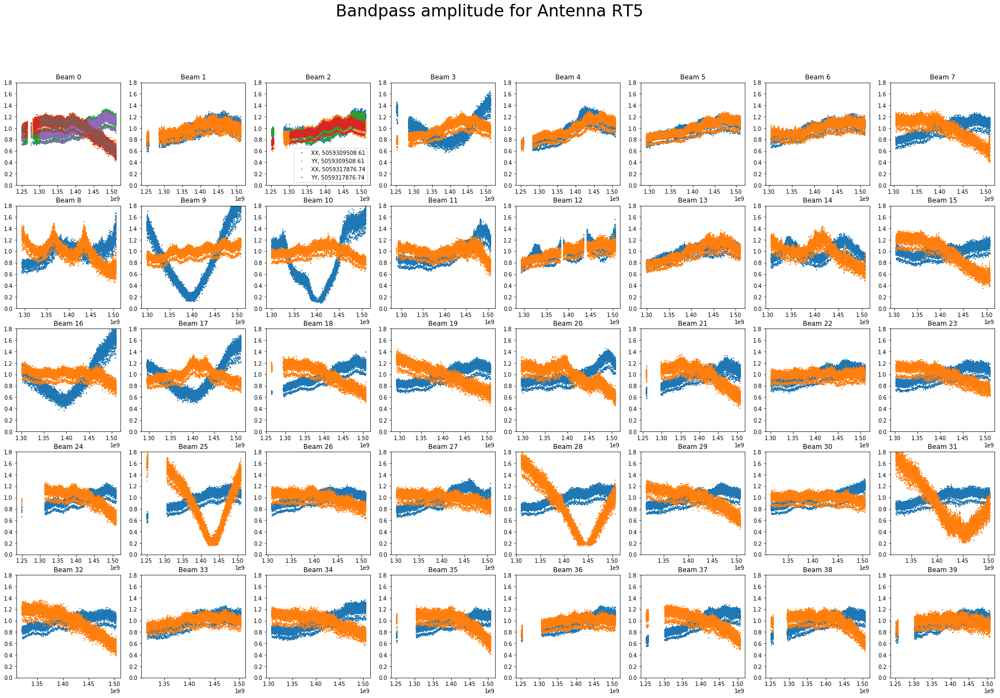

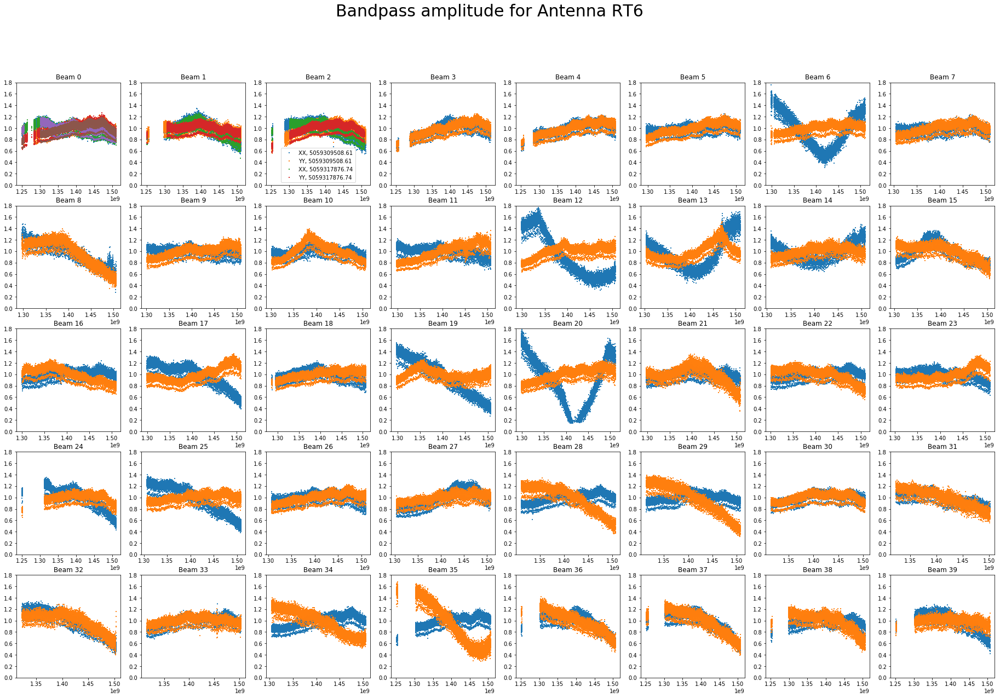

...

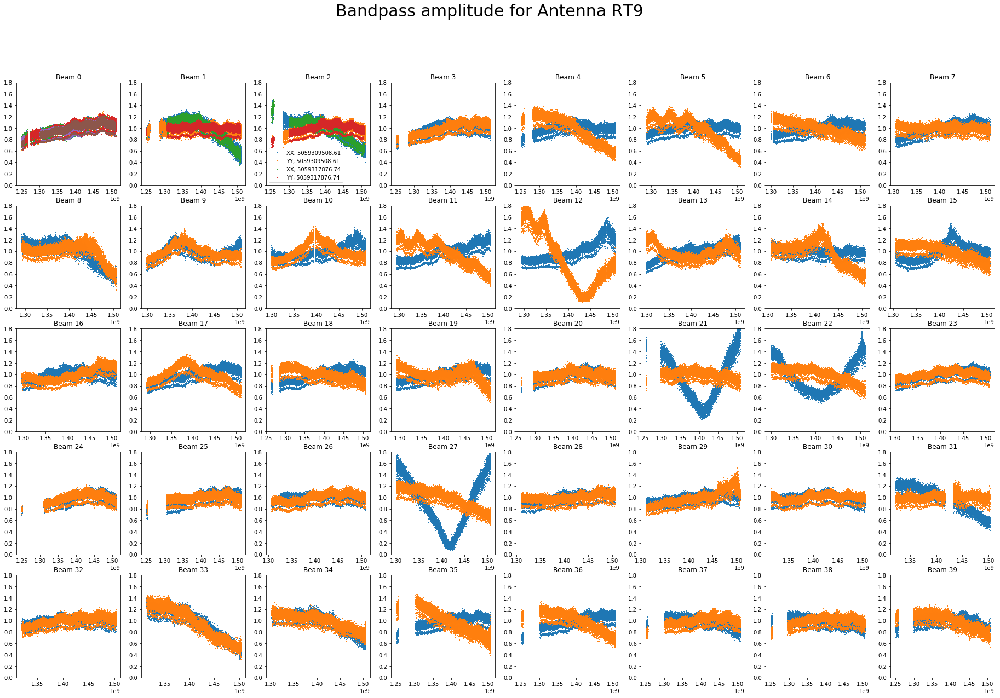

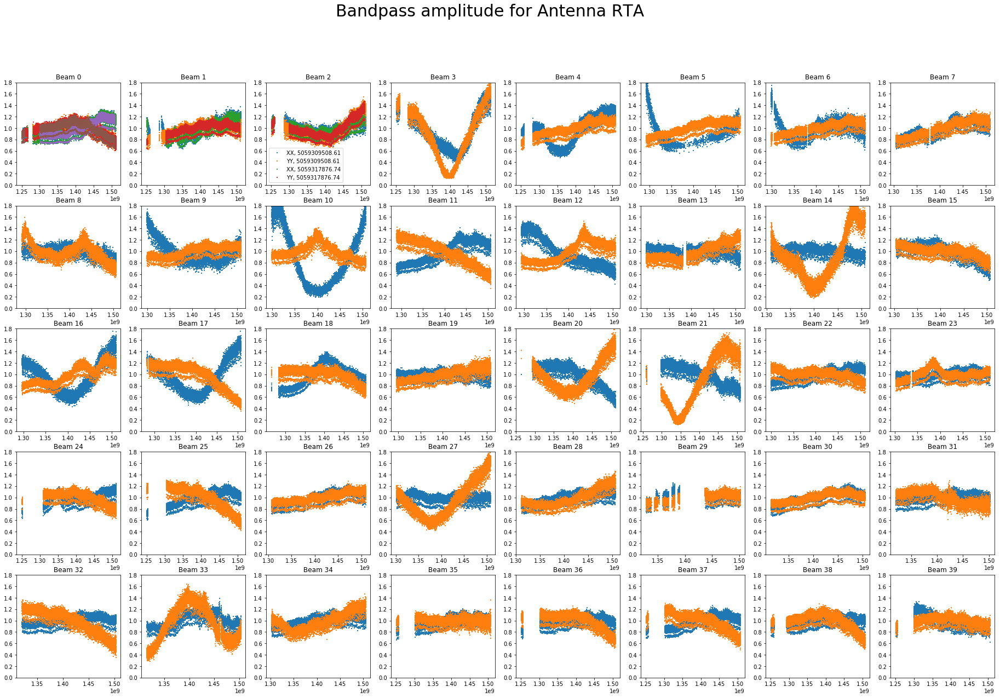

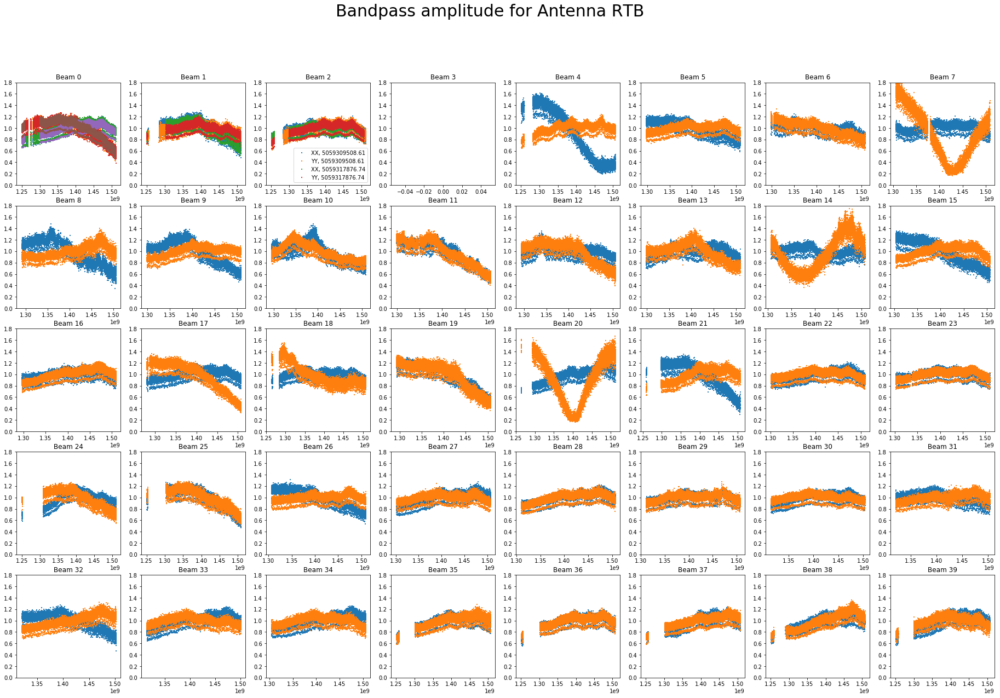

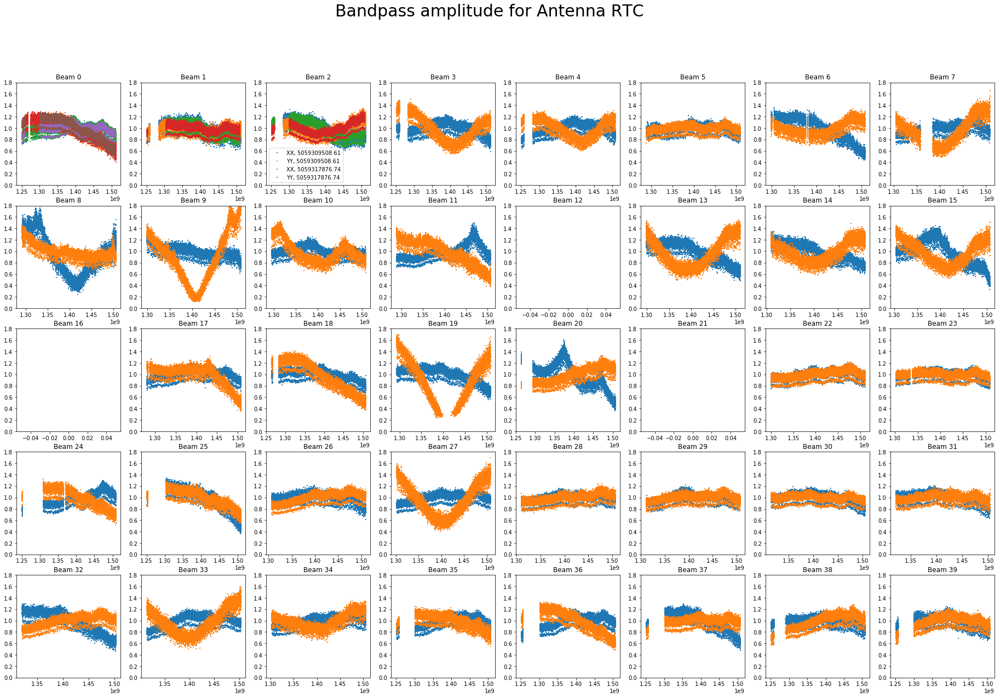

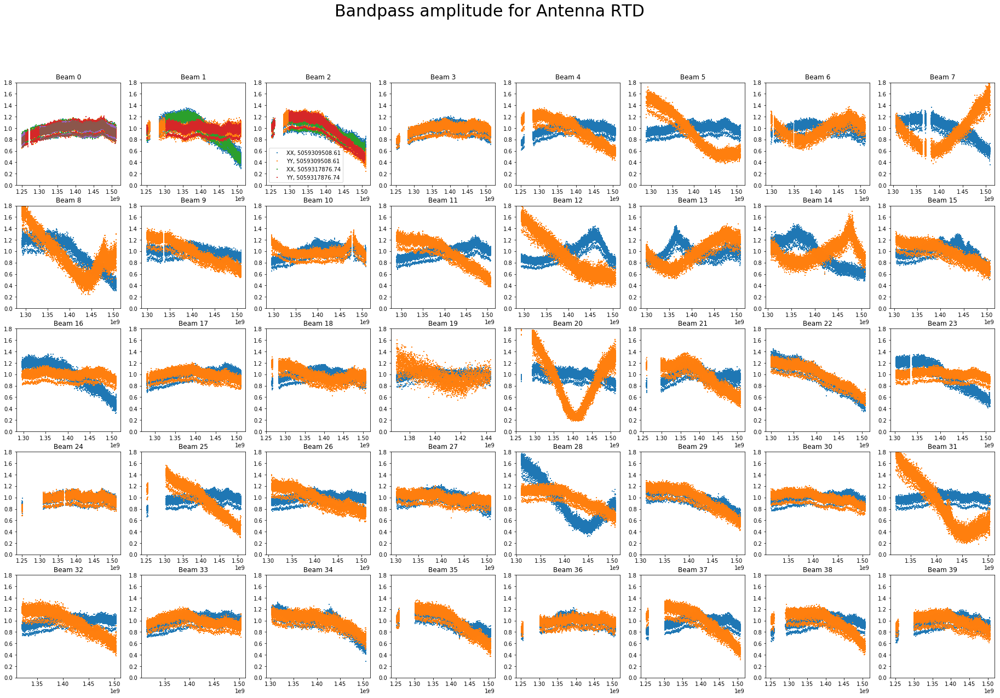

In [11]:
if bpsols == True:
    bp.plot_amp(imagepath=imagepath)

### Plot BP phases

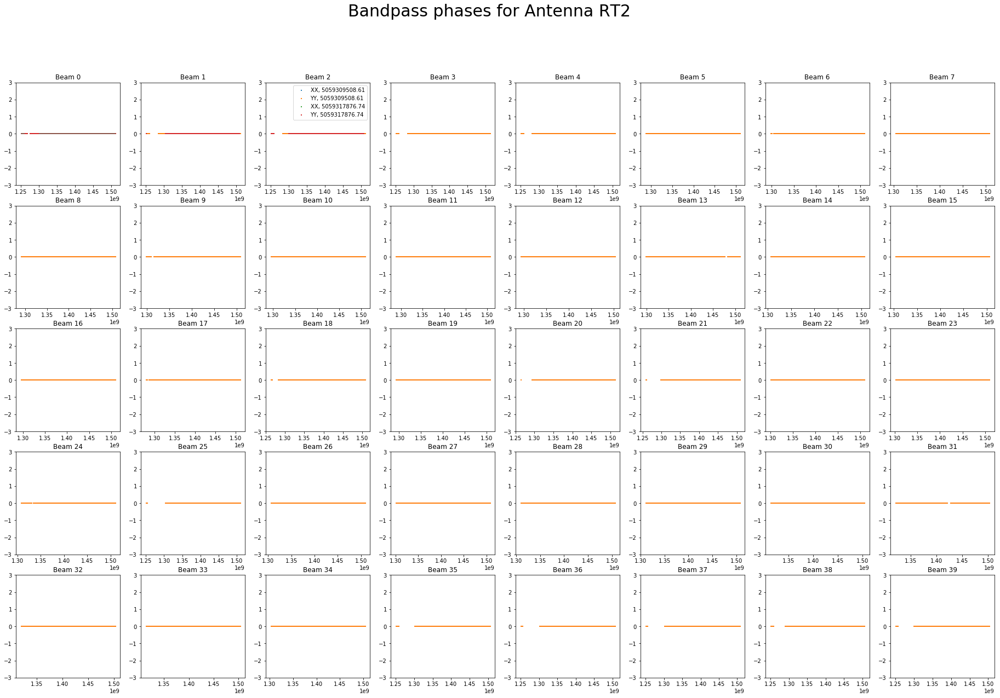

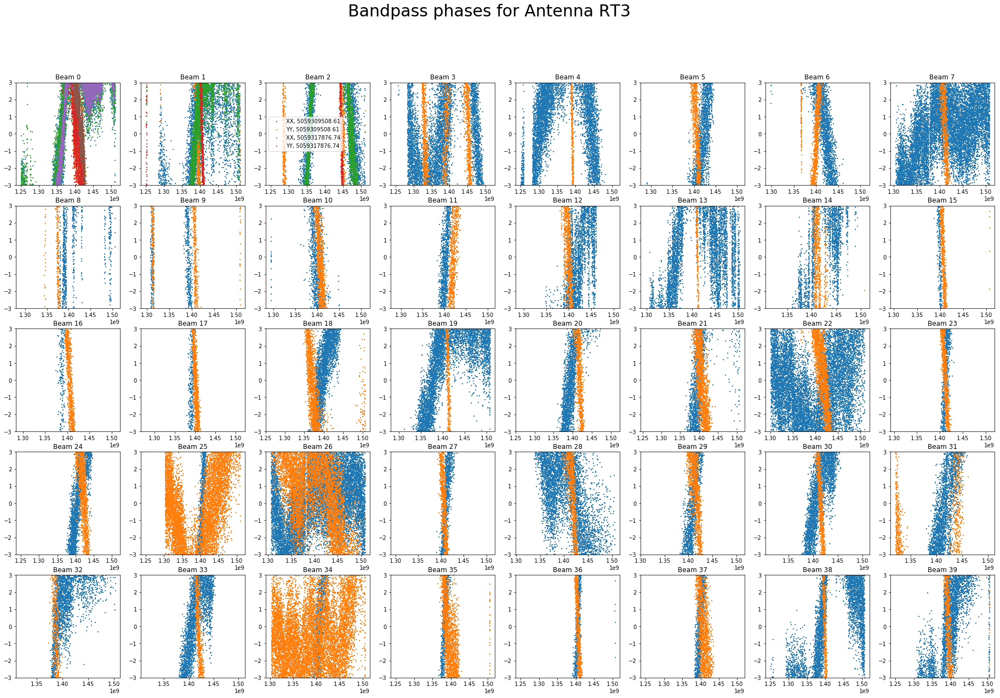

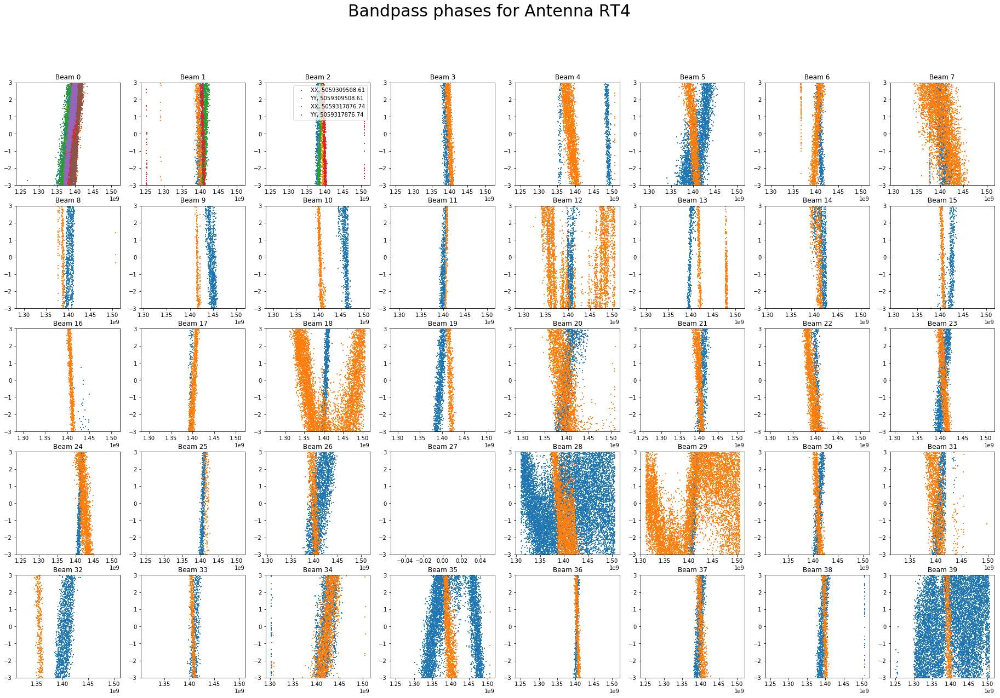

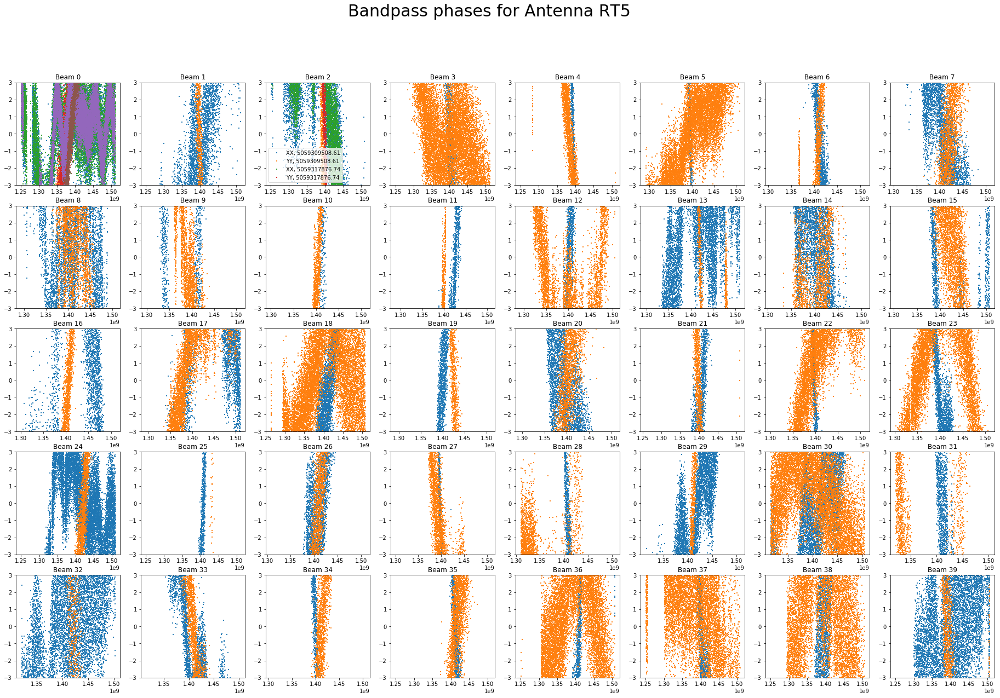

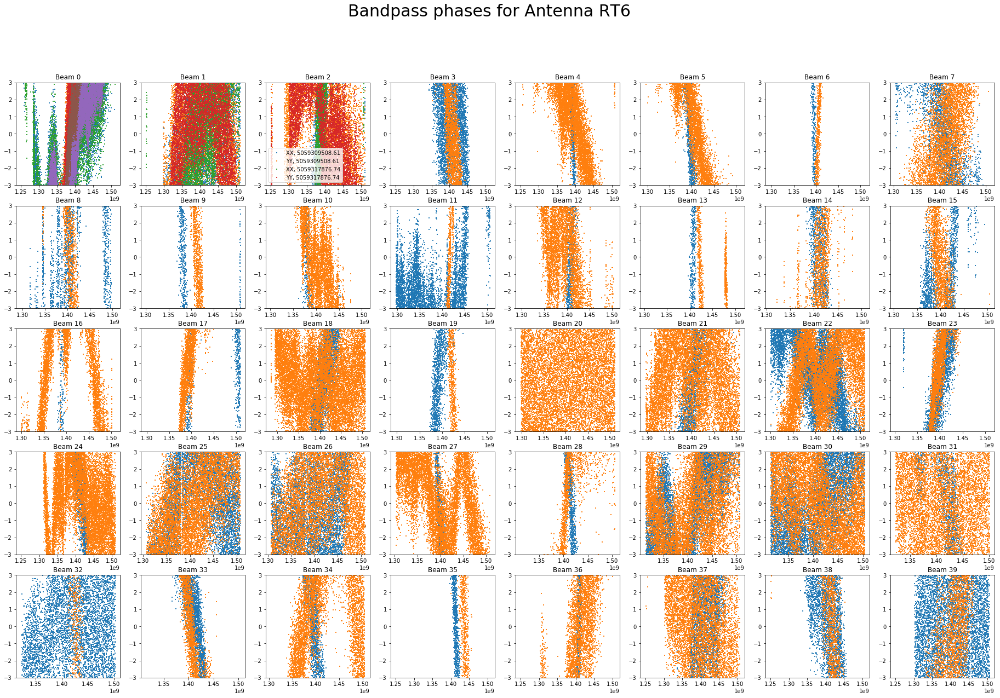

...

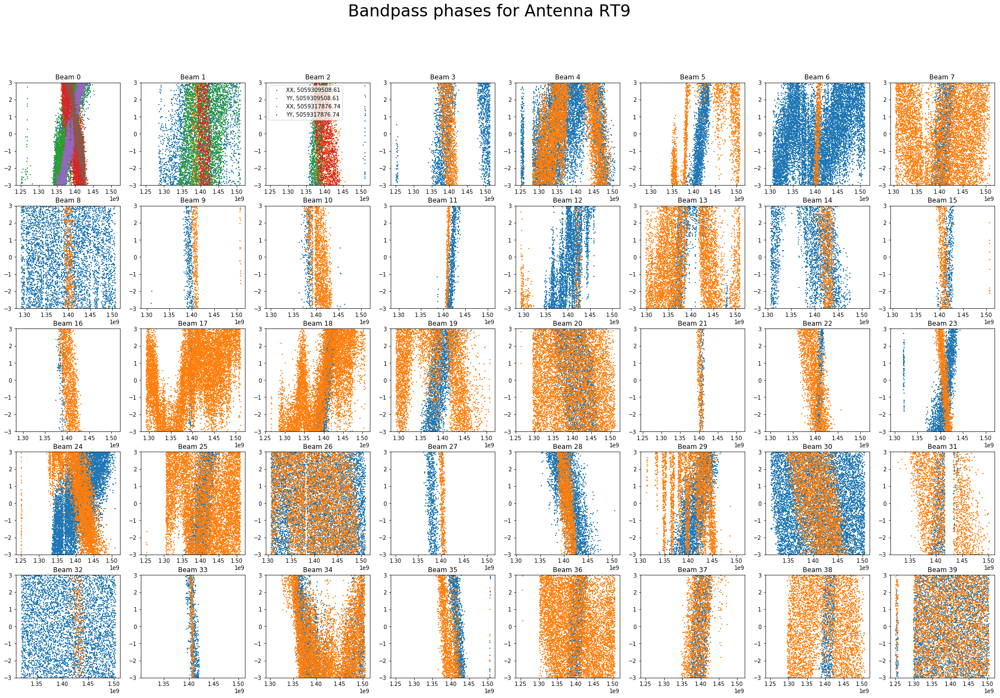

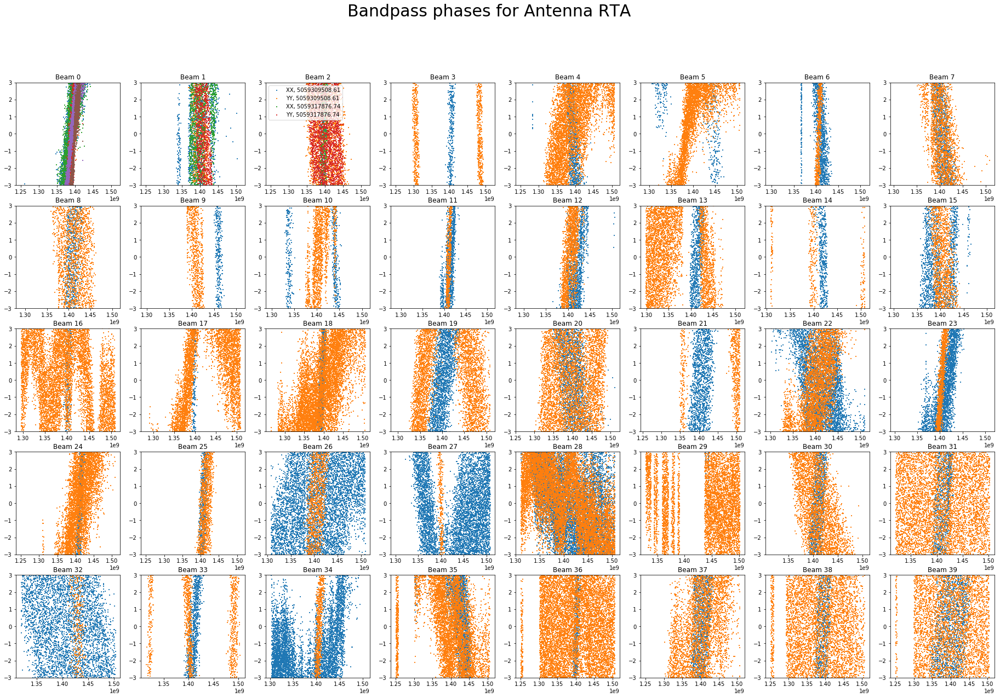

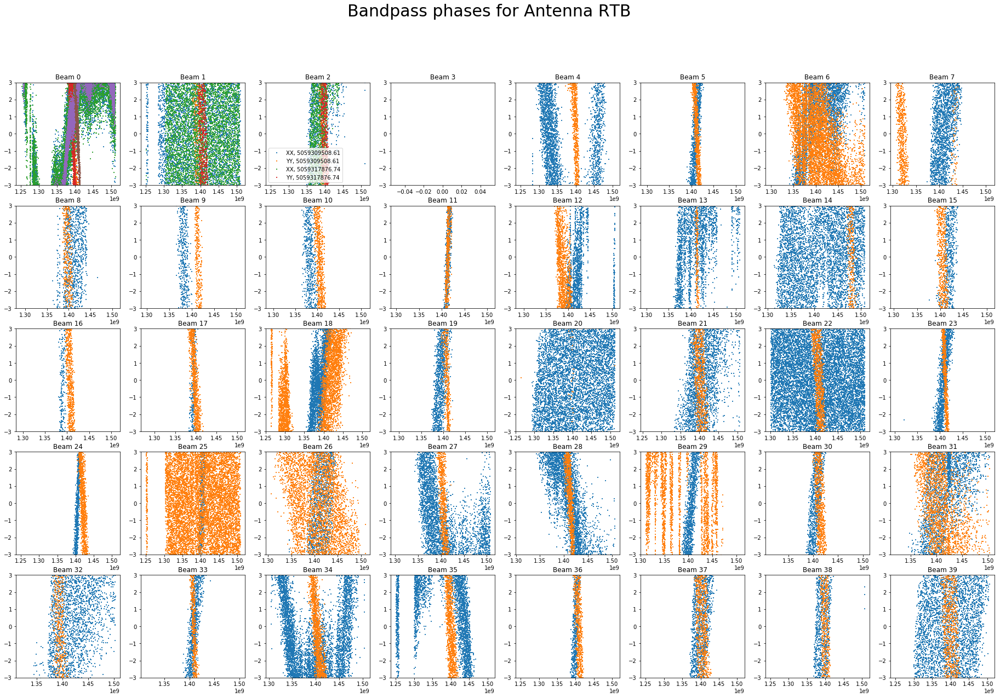

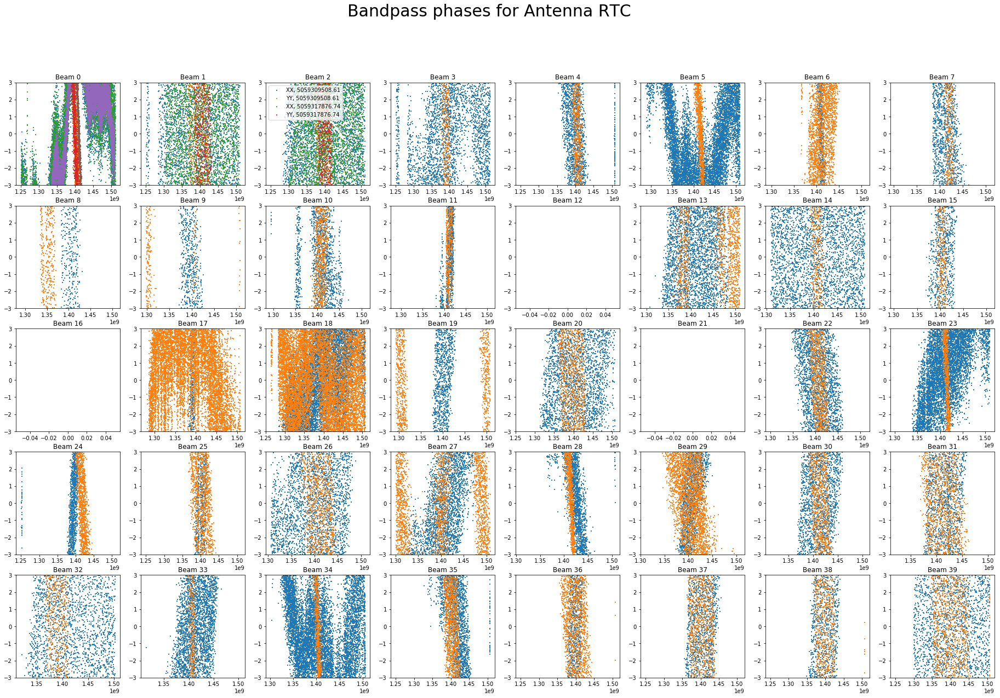

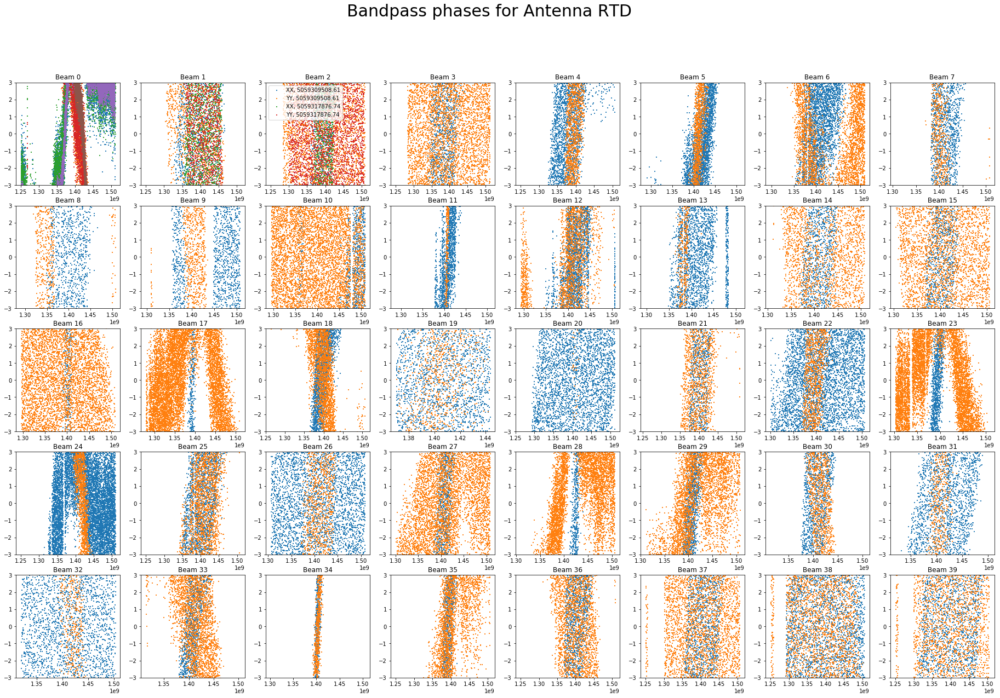

In [12]:
if bpsols == True:
    bp.plot_phase(imagepath=imagepath,ymin=phasemin,ymax=phasemax)